In [5]:
%pip install transformers
%pip install Pillow
%pip install torchvision
%pip install torch

Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
     |████████████████████████████████| 3.1 MB 5.6 MB/s eta 0:00:01
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
     |████████████████████████████████| 1.8 MB 4.9 MB/s eta 0:00:01
     |████████████████████████████████| 63.9 MB 3.5 MB/s eta 0:00:01
     |████████████████████████████████| 1.6 MB 5.1 MB/s eta 0:00:01
     |████████████████████████████████| 134 kB 5.3 MB/s eta 0:00:01
     |███████████████████████████

In [1]:
import os
import pandas as pd
from transformers import DistilBertTokenizer
from PIL import Image
from torchvision import transforms
import requests

/Users/shivamsachdeva/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(
/Users/shivamsachdeva/Library/Python/3.9/lib/python/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Set the path to your data directory
data_dir = "Dataset/"

# Initialize tokenizer and image transform
tokenizer = DistilBertTokenizer.from_pretrained("distilbert-base-uncased")
image_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Function to download and preprocess images
def process_image(url):
    try:
        response = requests.get(url, stream=True)
        image = Image.open(response.raw).convert("RGB")
        return image_transform(image)
    except Exception as e:
        print(f"Error downloading {url}: {e}")
        return None

# Load and preprocess all datasets
all_texts = []
all_images = []

for file_name in os.listdir(data_dir):
    if file_name.endswith(".csv"):  # Process only CSV files
        print(f"Processing: {file_name}")
        # Load the CSV file
        file_path = os.path.join(data_dir, file_name)
        dataset = pd.read_csv(file_path)
        
        # Preprocess text data
        text_data = dataset["name"].fillna("No description").tolist()
        if text_data:  # Ensure text_data is not empty
            tokenized_texts = tokenizer(
                text_data, 
                truncation=True, 
                padding=True, 
                max_length=128, 
                return_tensors="pt"
            )
            all_texts.append(tokenized_texts)
        
        # Preprocess image data
        image_urls = dataset["image"].fillna("").tolist()
        processed_images = []
        valid_rows = []

        for idx, url in enumerate(image_urls):
            if url:
                img = process_image(url)
                if img is not None:
                    processed_images.append(img)
                    valid_rows.append(idx)
                else:
                    # Replace the URL with a working one or remove the row
                    print(f"Skipping image URL: {url}")
                    if valid_rows:
                        url = image_urls[valid_rows[-1]]  # Use the last valid URL
                        dataset.at[idx, 'image'] = url
                        img = process_image(url)
                        if img is not None:
                            processed_images.append(img)
                            valid_rows.append(idx)
                        else:
                            print(f"Removing row with invalid image URL: {url}")
                    else:
                        print(f"Removing row with invalid image URL: {url}")
            else:
                # Handle the case where the URL is empty
                print(f"Empty image URL at index: {idx}")

        # Filter the dataset to keep only valid rows
        dataset = dataset.iloc[valid_rows]

        # Update the CSV file with valid rows only
        dataset.to_csv(file_path, index=False)

        all_images.extend(processed_images)

# Combine all preprocessed data
print(f"Total Texts: {len(all_texts)}")
print(f"Total Images: {len(all_images)}")

Processing: Suitcases and Trolley Bags.csv
Processing: All Sports Fitness and Outdoors.csv
Processing: Cardio Equipment.csv
Processing: Rucksacks.csv
Processing: Car Accessories.csv
Processing: Sunglasses.csv
Processing: Motorbike Accessories and Parts.csv
Processing: Furniture.csv
Processing: School Bags.csv
Processing: Refrigerators.csv
Processing: Yoga.csv
Processing: All Grocery and Gourmet Foods.csv
Processing: Kids Fashion.csv
Processing: Cycling.csv
Processing: Luxury Beauty.csv
Processing: Kids Shoes.csv
Processing: All Exercise and Fitness.csv
Processing: Janitorial and Sanitation Supplies.csv
Processing: Lab and Scientific.csv
Processing: Car Electronics.csv
Processing: Shoes.csv
Processing: Strollers and Prams.csv
Processing: Heating and Cooling Appliances.csv
Error downloading https://m.media-amazon.com/images/W/IMAGERENDERING_521856-T2/images/I/51dPET0mdFL._AC_UL320_.jpg: cannot identify image file <_io.BytesIO object at 0x17ff4be50>
Skipping image URL: https://m.media-ama

In [7]:
import pandas as pd

data_dir = "Dataset/"

def load_csv(file_path):
    """
    Load a CSV file into a pandas DataFrame.
    """
    return pd.read_csv(file_path)

def data_types(df):
    """
    Get the data types of each column in the DataFrame.
    """
    return df.dtypes

def missing_value_percentages(df):
    """
    Calculate the percentage of missing values for each column.
    """
    return (df.isnull().sum() / len(df)) * 100

def statistical_insights(df):
    """
    Get statistical insights for numeric and categorical columns.
    """
    # Check for numeric columns
    if not df.select_dtypes(include=[float, int]).empty:
        numeric_stats = df.describe(include=[float, int]).T
    else:
        numeric_stats = pd.DataFrame(columns=["count", "mean", "std", "min", "25%", "50%", "75%", "max"])
    
    # Check for categorical columns
    if not df.select_dtypes(include=[object]).empty:
        categorical_stats = df.describe(include=[object]).T
        categorical_stats['cardinality'] = df.select_dtypes(include=[object]).nunique()
    else:
        categorical_stats = pd.DataFrame(columns=["count", "unique", "top", "freq", "cardinality"])
    
    return numeric_stats, categorical_stats

def analyze_csv(file_path):
    """
    Perform EDA on a CSV file and return insights.
    """
    df = load_csv(file_path)
    print("Data Types:")
    print(data_types(df))
    print("\nMissing Value Percentages:")
    print(missing_value_percentages(df))
    print("\nStatistical Insights:")
    numeric_stats, categorical_stats = statistical_insights(df)
    print("\nNumeric Columns:")
    print(numeric_stats)
    print("\nCategorical Columns:")
    print(categorical_stats)

# Example usage
file_path = data_dir+"Air Conditioners.csv"
analyze_csv(file_path)

Data Types:
name              object
main_category     object
sub_category      object
image             object
link              object
ratings           object
no_of_ratings     object
discount_price    object
actual_price      object
dtype: object

Missing Value Percentages:
name               0.000000
main_category      0.000000
sub_category       0.000000
image              0.000000
link               0.000000
ratings           41.098485
no_of_ratings     41.098485
discount_price    35.037879
actual_price      28.030303
dtype: float64

Statistical Insights:

Numeric Columns:
Empty DataFrame
Columns: [count, mean, std, min, 25%, 50%, 75%, max]
Index: []

Categorical Columns:
               count unique  \
name             528    522   
main_category    528      1   
sub_category     528      1   
image            528    457   
link             528    528   
ratings          311     28   
no_of_ratings    311    150   
discount_price   343    240   
actual_price     380    253   

 

In [9]:
pip install pandas matplotlib seaborn

Defaulting to user installation because normal site-packages is not writeable
     |████████████████████████████████| 7.8 MB 6.4 MB/s eta 0:00:01
     |████████████████████████████████| 294 kB 9.6 MB/s eta 0:00:01
     |████████████████████████████████| 249 kB 9.6 MB/s eta 0:00:01
     |████████████████████████████████| 2.8 MB 9.0 MB/s eta 0:00:01
     |████████████████████████████████| 111 kB 6.2 MB/s eta 0:00:01
     |████████████████████████████████| 64 kB 8.2 MB/s  eta 0:00:01
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


Matplotlib is building the font cache; this may take a moment.


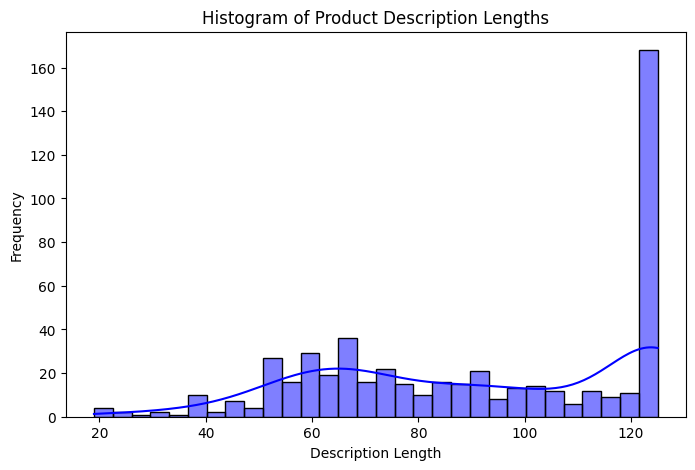

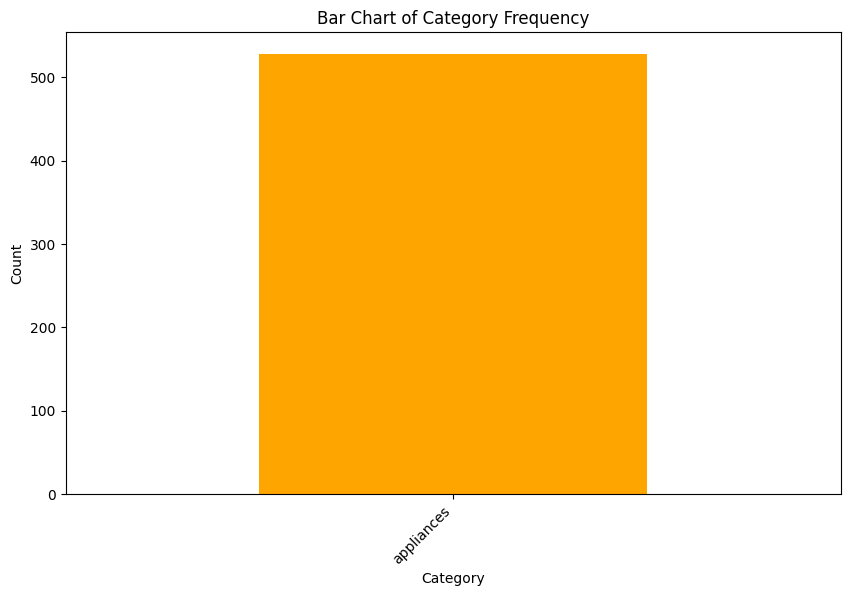

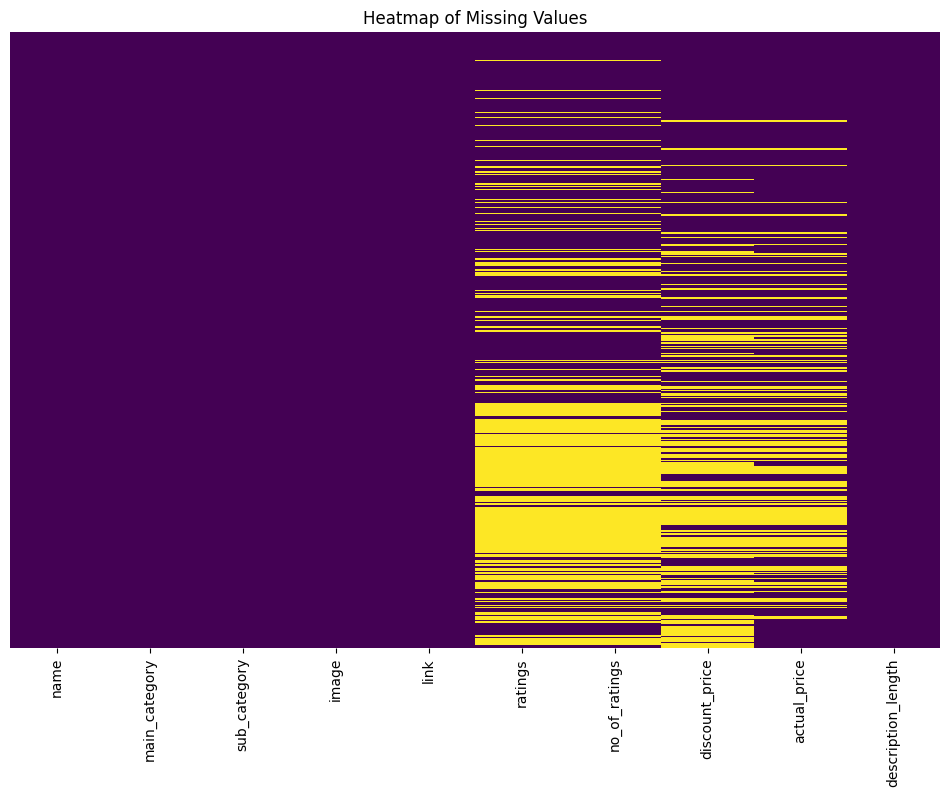

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns

def load_csv(file_path):
    """
    Load a CSV file into a pandas DataFrame.
    """
    return pd.read_csv(file_path)

def plot_description_length_histogram(df, description_column):
    """
    Plot a histogram of product description lengths.
    """
    if description_column in df.columns:
        df['description_length'] = df[description_column].astype(str).apply(len)
        plt.figure(figsize=(8, 5))
        sns.histplot(df['description_length'], bins=30, kde=True, color='blue')
        plt.title('Histogram of Product Description Lengths')
        plt.xlabel('Description Length')
        plt.ylabel('Frequency')
        plt.show()
    else:
        print(f"Column '{description_column}' not found in the dataset.")

def plot_category_frequency_bar_chart(df, category_column):
    """
    Plot a bar chart of category frequencies.
    """
    if category_column in df.columns:
        plt.figure(figsize=(10, 6))
        df[category_column].value_counts().plot(kind='bar', color='orange')
        plt.title('Bar Chart of Category Frequency')
        plt.xlabel('Category')
        plt.ylabel('Count')
        plt.xticks(rotation=45, ha='right')
        plt.show()
    else:
        print(f"Column '{category_column}' not found in the dataset.")

def plot_missing_values_heatmap(df):
    """
    Plot a heatmap showing missing values per attribute.
    """
    plt.figure(figsize=(12, 8))
    sns.heatmap(df.isnull(), cbar=False, cmap='viridis', yticklabels=False)
    plt.title('Heatmap of Missing Values')
    plt.show()

def analyze_csv_with_visuals(file_path, description_column, category_column):
    """
    Perform visual analysis on a CSV file.
    """
    df = load_csv(file_path)
    
    # Plot histogram of product description lengths
    plot_description_length_histogram(df, description_column)
    
    # Plot bar chart of category frequency
    plot_category_frequency_bar_chart(df, category_column)
    
    # Plot heatmap of missing values
    plot_missing_values_heatmap(df)

# Example usage
file_path = "Dataset/Air Conditioners.csv"
description_column = "name"  # Column containing product descriptions
category_column = "main_category"  # Column containing product categories
analyze_csv_with_visuals(file_path, description_column, category_column)

Create a Combined Dataset

In [3]:
import torch
from torch.utils.data import Dataset, DataLoader

In [17]:
print([len(t["input_ids"]) for t in all_texts])  # Debug sequence lengths
print([len(t["attention_mask"]) for t in all_texts])

for i, t in enumerate(all_texts):
    print(f"Sample {i}: input_ids shape = {torch.tensor(t['input_ids']).shape}")
    print(f"Sample {i}: attention_mask shape = {torch.tensor(t['attention_mask']).shape}")



[821, 754, 122, 1405, 900, 967, 874, 781, 1546, 1505, 733, 726, 1597, 733, 531, 1305, 967, 607, 755, 516, 1209, 459, 9600, 461, 555, 1272, 657, 1440, 851, 607, 825, 781, 912, 1056, 2064, 1440, 783, 741, 2112, 655, 1637, 994, 928, 66, 2016, 781, 803, 828, 1104, 826, 1104, 875, 1257, 24, 708, 403, 827, 2640, 947, 877, 24, 1824, 1224, 1152, 1056, 48, 19133, 875, 9600, 528, 1830, 876, 441, 44, 731, 1080, 634, 849]
[821, 754, 122, 1405, 900, 967, 874, 781, 1546, 1505, 733, 726, 1597, 733, 531, 1305, 967, 607, 755, 516, 1209, 459, 9600, 461, 555, 1272, 657, 1440, 851, 607, 825, 781, 912, 1056, 2064, 1440, 783, 741, 2112, 655, 1637, 994, 928, 66, 2016, 781, 803, 828, 1104, 826, 1104, 875, 1257, 24, 708, 403, 827, 2640, 947, 877, 24, 1824, 1224, 1152, 1056, 48, 19133, 875, 9600, 528, 1830, 876, 441, 44, 731, 1080, 634, 849]
Sample 0: input_ids shape = torch.Size([821, 43])
Sample 0: attention_mask shape = torch.Size([821, 43])
Sample 1: input_ids shape = torch.Size([754, 51])
Sample 1: attenti

/var/folders/3f/64pzz2pj38q72ncc65dv4k440000gn/T/ipykernel_953/1172921621.py:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  print(f"Sample {i}: input_ids shape = {torch.tensor(t['input_ids']).shape}")
/var/folders/3f/64pzz2pj38q72ncc65dv4k440000gn/T/ipykernel_953/1172921621.py:6: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  print(f"Sample {i}: attention_mask shape = {torch.tensor(t['attention_mask']).shape}")


In [18]:
import torch
from torch.nn.utils.rnn import pad_sequence

# Convert to 1D tensors before padding
input_ids_list = [torch.tensor(t["input_ids"], dtype=torch.long).squeeze() for t in all_texts]
attention_mask_list = [torch.tensor(t["attention_mask"], dtype=torch.long).squeeze() for t in all_texts]


/var/folders/3f/64pzz2pj38q72ncc65dv4k440000gn/T/ipykernel_953/2260138897.py:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  input_ids_list = [torch.tensor(t["input_ids"], dtype=torch.long).squeeze() for t in all_texts]
/var/folders/3f/64pzz2pj38q72ncc65dv4k440000gn/T/ipykernel_953/2260138897.py:6: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  attention_mask_list = [torch.tensor(t["attention_mask"], dtype=torch.long).squeeze() for t in all_texts]


In [24]:
max_len = 50  # Adjust as needed

for t in all_texts:
    t["input_ids"] = t["input_ids"][:max_len]
    t["attention_mask"] = t["attention_mask"][:max_len]

input_ids_list = [torch.tensor(t["input_ids"], dtype=torch.long) for t in all_texts]
attention_mask_list = [torch.tensor(t["attention_mask"], dtype=torch.long) for t in all_texts]


/var/folders/3f/64pzz2pj38q72ncc65dv4k440000gn/T/ipykernel_953/3679677534.py:7: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  input_ids_list = [torch.tensor(t["input_ids"], dtype=torch.long) for t in all_texts]
/var/folders/3f/64pzz2pj38q72ncc65dv4k440000gn/T/ipykernel_953/3679677534.py:8: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  attention_mask_list = [torch.tensor(t["attention_mask"], dtype=torch.long) for t in all_texts]


In [25]:
# Ensure all input tensors are 2D tensors
input_ids_list = [torch.tensor(t["input_ids"], dtype=torch.long) for t in all_texts]
attention_mask_list = [torch.tensor(t["attention_mask"], dtype=torch.long) for t in all_texts]

# Find the maximum length of the sequences
max_len = max([t.size(1) for t in input_ids_list])

# Pad all sequences to the maximum length
input_ids_list = [torch.cat([t, torch.zeros((t.size(0), max_len - t.size(1)), dtype=torch.long)], dim=1) for t in input_ids_list]
attention_mask_list = [torch.cat([t, torch.zeros((t.size(0), max_len - t.size(1)), dtype=torch.long)], dim=1) for t in attention_mask_list]

# Stack the padded sequences
padded_input_ids = torch.cat(input_ids_list, dim=0)
padded_attention_mask = torch.cat(attention_mask_list, dim=0)


/var/folders/3f/64pzz2pj38q72ncc65dv4k440000gn/T/ipykernel_953/2225279263.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  input_ids_list = [torch.tensor(t["input_ids"], dtype=torch.long) for t in all_texts]
/var/folders/3f/64pzz2pj38q72ncc65dv4k440000gn/T/ipykernel_953/2225279263.py:3: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  attention_mask_list = [torch.tensor(t["attention_mask"], dtype=torch.long) for t in all_texts]


In [26]:
combined_texts = {
    "input_ids": padded_input_ids,
    "attention_mask": padded_attention_mask
}

# Create PyTorch DataLoader
dataset = MultiModalDataset(combined_texts, all_images)
data_loader = DataLoader(dataset, batch_size=4, shuffle=True)

Train the Model

In [27]:
import torch.nn as nn
import torch.optim as Adam
from transformers import DistilBertModel
from torchvision.models import resnet50
import torch.optim as optim

In [35]:
class MultiModalDataset(Dataset):
    def __init__(self, all_texts, all_images):
        # Ensure all inputs have the same length
        min_length = min(len(all_texts["input_ids"]), len(all_texts["attention_mask"]), len(all_images))
        self.texts = {
            "input_ids": all_texts["input_ids"][:min_length],
            "attention_mask": all_texts["attention_mask"][:min_length]
        }
        self.images = all_images[:min_length]

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        # Ensure the index is within bounds
        if idx >= len(self):
            raise IndexError(f"Index {idx} is out of bounds for dataset of size {len(self)}")
        
        text_input = {key: val[idx] for key, val in self.texts.items()}
        image_input = self.images[idx]
        return text_input, image_input

# Create PyTorch DataLoader
dataset = MultiModalDataset(combined_texts, all_images)
data_loader = DataLoader(dataset, batch_size=4, shuffle=True, drop_last=True)

# Training loop
model.train()
for epoch in range(1):  # Number of epochs
    for batch in data_loader:
        text_inputs = {
            "input_ids": batch[0]["input_ids"].to(device),
            "attention_mask": batch[0]["attention_mask"].to(device)
        }
        image_inputs = batch[1].to(device)
        
        # Forward pass
        outputs = model(text_inputs, image_inputs)
        labels = torch.randint(0, 10, (image_inputs.size(0),), device=device)  # Dummy labels
        loss = criterion(outputs, labels)

        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        print(f"Epoch: {epoch}, Loss: {loss.item()}")

Epoch: 0, Loss: 2.317229747772217
Epoch: 0, Loss: 2.314338207244873
Epoch: 0, Loss: 2.178903341293335
Epoch: 0, Loss: 2.3061418533325195
Epoch: 0, Loss: 2.2735447883605957
Epoch: 0, Loss: 2.095926523208618
Epoch: 0, Loss: 2.118664264678955
Epoch: 0, Loss: 2.338646411895752
Epoch: 0, Loss: 2.8712494373321533
Epoch: 0, Loss: 2.0500025749206543
Epoch: 0, Loss: 3.2045819759368896
Epoch: 0, Loss: 2.212660312652588
Epoch: 0, Loss: 2.8612964153289795
Epoch: 0, Loss: 2.3381175994873047
Epoch: 0, Loss: 2.58656907081604
Epoch: 0, Loss: 2.688108444213867
Epoch: 0, Loss: 2.108407497406006
Epoch: 0, Loss: 2.0454578399658203
Epoch: 0, Loss: 2.2981536388397217
Epoch: 0, Loss: 2.382613182067871
Epoch: 0, Loss: 2.315056562423706
Epoch: 0, Loss: 2.646162986755371
Epoch: 0, Loss: 2.3304672241210938
Epoch: 0, Loss: 2.4797861576080322
Epoch: 0, Loss: 2.6148242950439453
Epoch: 0, Loss: 2.1199097633361816
Epoch: 0, Loss: 2.2993428707122803
Epoch: 0, Loss: 2.4285635948181152
Epoch: 0, Loss: 2.4631619453430176

In [42]:
from sklearn.model_selection import ParameterGrid
from torch.optim import Adam
import torch.nn as nn

# Define the multi-modal model
multi_modal_model = MultiModalFusion(text_encoder, vision_encoder, num_ftrs)

# Move the model to the appropriate device (e.g., GPU if available)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
multi_modal_model.to(device)

# Hyperparameter grid
param_grid = {
    "learning_rate": [1e-5, 3e-5, 1e-4],
    "fusion_layer_size": [512, 1024],
}

# Iterate over parameters
for params in ParameterGrid(param_grid):
    print(f"Testing params: {params}")
    
    # Update the fusion layer size
    multi_modal_model.fc = nn.Linear(768 + 2048, params["fusion_layer_size"]).to(device)
    
    # Define the optimizer with the current learning rate
    optimizer = Adam(multi_modal_model.parameters(), lr=params["learning_rate"])
    
    # Train and evaluate the model (replace with your training loop)
    # Example:
    # for epoch in range(num_epochs):
    #     train_model(multi_modal_model, optimizer, train_loader)
    #     evaluate_model(multi_modal_model, val_loader)

Testing params: {'fusion_layer_size': 512, 'learning_rate': 1e-05}
Testing params: {'fusion_layer_size': 512, 'learning_rate': 3e-05}
Testing params: {'fusion_layer_size': 512, 'learning_rate': 0.0001}
Testing params: {'fusion_layer_size': 1024, 'learning_rate': 1e-05}
Testing params: {'fusion_layer_size': 1024, 'learning_rate': 3e-05}
Testing params: {'fusion_layer_size': 1024, 'learning_rate': 0.0001}


In [43]:
def train_model(model, optimizer, data_loader, criterion, device):
    model.train()
    for batch in data_loader:
        text_inputs = {
            "input_ids": batch[0]["input_ids"].to(device),
            "attention_mask": batch[0]["attention_mask"].to(device)
        }
        image_inputs = batch[1].to(device)
        
        # Forward pass
        outputs = model(text_inputs, image_inputs)
        labels = torch.randint(0, 10, (image_inputs.size(0),), device=device)  # Dummy labels
        loss = criterion(outputs, labels)
        
        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

# Example usage in the hyperparameter loop
criterion = nn.CrossEntropyLoss()

for params in ParameterGrid(param_grid):
    print(f"Testing params: {params}")
    
    # Update the fusion layer size
    multi_modal_model.fc = nn.Linear(768 + 2048, params["fusion_layer_size"]).to(device)
    
    # Define the optimizer with the current learning rate
    optimizer = Adam(multi_modal_model.parameters(), lr=params["learning_rate"])
    
    # Train the model
    for epoch in range(5):  # Example: 5 epochs
        train_model(multi_modal_model, optimizer, data_loader, criterion, device)
        print(f"Epoch {epoch + 1} completed for params: {params}")

Testing params: {'fusion_layer_size': 512, 'learning_rate': 1e-05}
Epoch 1 completed for params: {'fusion_layer_size': 512, 'learning_rate': 1e-05}
Epoch 2 completed for params: {'fusion_layer_size': 512, 'learning_rate': 1e-05}
Epoch 3 completed for params: {'fusion_layer_size': 512, 'learning_rate': 1e-05}
Epoch 4 completed for params: {'fusion_layer_size': 512, 'learning_rate': 1e-05}
Epoch 5 completed for params: {'fusion_layer_size': 512, 'learning_rate': 1e-05}
Testing params: {'fusion_layer_size': 512, 'learning_rate': 3e-05}
Epoch 1 completed for params: {'fusion_layer_size': 512, 'learning_rate': 3e-05}
Epoch 2 completed for params: {'fusion_layer_size': 512, 'learning_rate': 3e-05}
Epoch 3 completed for params: {'fusion_layer_size': 512, 'learning_rate': 3e-05}
Epoch 4 completed for params: {'fusion_layer_size': 512, 'learning_rate': 3e-05}
Epoch 5 completed for params: {'fusion_layer_size': 512, 'learning_rate': 3e-05}
Testing params: {'fusion_layer_size': 512, 'learning_rat

In [ ]:
# # Define text and vision encoders
# text_encoder = DistilBertModel.from_pretrained("distilbert-base-uncased")
# vision_encoder = resnet50(pretrained=True)
# num_ftrs = vision_encoder.fc.in_features  # Get the number of input features for the final fully connected layer
# vision_encoder.fc = nn.Identity()  # Remove the final fully connected layer

# # Define a simple multi-modal fusion model
# class MultiModalFusion(nn.Module):
#     def __init__(self, text_encoder, vision_encoder, num_ftrs):
#         super(MultiModalFusion, self).__init__()
#         self.text_encoder = text_encoder
#         self.vision_encoder = vision_encoder
#         self.fc = nn.Linear(text_encoder.config.hidden_size + num_ftrs, 10)  # Example output size

#     def forward(self, text_inputs, image_inputs):
#         text_features = self.text_encoder(**text_inputs).last_hidden_state[:, 0, :]
#         image_features = self.vision_encoder(image_inputs)
#         image_features = image_features.view(image_features.size(0), -1)
#         combined_features = torch.cat((text_features, image_features), dim=1)
#         output = self.fc(combined_features)
#         return output

# model = MultiModalFusion(text_encoder, vision_encoder, num_ftrs)

# # Move model to the appropriate device
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# model.to(device)

# # Optimizer and loss function
# optimizer = optim.Adam(model.parameters(), lr=1e-4)
# criterion = nn.CrossEntropyLoss()  # Example loss for attribute prediction

# # Training loop
# model.train()
# for epoch in range(1):  # Number of epochs
#     for batch in data_loader:
#         text_inputs = {
#             "input_ids": batch["input_ids"].to(device),
#             "attention_mask": batch["attention_mask"].to(device)
#         }
#         image_inputs = batch["images"].to(device)
        
#         # Ensure the indices are within bounds
#         max_index = min(text_inputs["input_ids"].size(0), image_inputs.size(0), batch["input_ids"].size(1))
#         text_inputs["input_ids"] = text_inputs["input_ids"][:, :max_index]
#         text_inputs["attention_mask"] = text_inputs["attention_mask"][:, :max_index]
#         image_inputs = image_inputs[:max_index]

#         # Forward pass
#         outputs = model(text_inputs, image_inputs)
#         labels = torch.randint(0, 10, (image_inputs.size(0),), device=device)  # Dummy labels
#         loss = criterion(outputs, labels)

#         # Backward pass
#         optimizer.zero_grad()
#         loss.backward()
#         optimizer.step()

#         print(f"Epoch: {epoch}, Loss: {loss.item()}")

IndexError: index 36852 is out of bounds for dimension 0 with size 3840

In [44]:
%pip install evaluate

from evaluate import load

# BLEU evaluation
bleu_metric = load("bleu")
generated_texts = ["A sleek air conditioner with energy-saving features."]
reference_texts = [["A stylish air conditioner with multiple cooling modes."]]
bleu_score = bleu_metric.compute(predictions=generated_texts, references=reference_texts)
print("BLEU Score:", bleu_score)

Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.
BLEU Score: {'bleu': 0.0, 'precisions': [0.625, 0.2857142857142857, 0.16666666666666666, 0.0], 'brevity_penalty': 0.8824969025845955, 'length_ratio': 0.8888888888888888, 'translation_length': 8, 'reference_length': 9}


In [1]:
from evaluate import load
import string

# BLEU evaluation
bleu_metric = load("bleu")

# Normalize texts (lowercase and remove punctuation)
def normalize(text):
    return text.lower().translate(str.maketrans("", "", string.punctuation))

generated_texts = [normalize("A sleek air conditioner with energy-saving features.")]
reference_texts = [[normalize("A stylish air conditioner with multiple cooling modes.")]]

# Compute BLEU score with smoothing
bleu_score = bleu_metric.compute(predictions=generated_texts, references=reference_texts, smooth=True)
print("BLEU Score:", bleu_score)

/Users/shivamsachdeva/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(
/Users/shivamsachdeva/Library/Python/3.9/lib/python/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm

BLEU Score: {'bleu': 0.31689174383082924, 'precisions': [0.625, 0.42857142857142855, 0.3333333333333333, 0.2], 'brevity_penalty': 0.8668778997501817, 'length_ratio': 0.875, 'translation_length': 7, 'reference_length': 8}


In [38]:
pip install nltk rouge-score

Defaulting to user installation because normal site-packages is not writeable
     |████████████████████████████████| 1.5 MB 1.8 MB/s eta 0:00:01
     |████████████████████████████████| 98 kB 2.6 MB/s eta 0:00:011
  Created wheel for rouge-score: filename=rouge_score-0.1.2-py3-none-any.whl size=24955 sha256=4042b4496a578e34021246d7d72d966dc84a85d949397ca5caa74233acbb24bf
  Stored in directory: /Users/shivamsachdeva/Library/Caches/pip/wheels/9b/3d/39/09558097d3119ca0a4d462df68f22c6f3c1b345ac63a09b86e
Successfully built rouge-score
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [45]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/shivamsachdeva/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [46]:
# Install required dependencies (run this in your terminal or notebook)
# !pip install nltk rouge-score

# Download NLTK data
import nltk
nltk.download('punkt')

# Load the ROUGE metric
from evaluate import load
rouge = load("rouge")

# Example usage
generated_texts = ["The cat is on the mat.", "It is a sunny day."]
reference_texts = ["The cat is sitting on the mat.", "Today is a sunny day."]

# Compute ROUGE score
rouge_score = rouge.compute(predictions=generated_texts, references=reference_texts)
print("ROUGE Score:", rouge_score)

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/shivamsachdeva/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


ROUGE Score: {'rouge1': 0.8615384615384616, 'rouge2': 0.7386363636363635, 'rougeL': 0.8615384615384616, 'rougeLsum': 0.8615384615384616}


#Hyper-parameter tuning

In [47]:
from sklearn.model_selection import ParameterGrid

# Hyperparameter grid
param_grid = {
    "learning_rate": [1e-5, 3e-5, 1e-4],
    "fusion_layer_size": [512, 1024],
}

# Iterate over parameters
for params in ParameterGrid(param_grid):
    print(f"Testing params: {params}")
    multi_modal_model.fc = nn.Linear(768 + 2048, params["fusion_layer_size"])
    optimizer = Adam(multi_modal_model.parameters(), lr=params["learning_rate"])
    # Train and evaluate the model


Testing params: {'fusion_layer_size': 512, 'learning_rate': 1e-05}
Testing params: {'fusion_layer_size': 512, 'learning_rate': 3e-05}
Testing params: {'fusion_layer_size': 512, 'learning_rate': 0.0001}
Testing params: {'fusion_layer_size': 1024, 'learning_rate': 1e-05}
Testing params: {'fusion_layer_size': 1024, 'learning_rate': 3e-05}
Testing params: {'fusion_layer_size': 1024, 'learning_rate': 0.0001}


In [48]:
from joblib import dump, load

# Save state
dump([multi_modal_model, num_ftrs, optimizer], 'model_state.joblib')

# # Load state
# model, variable1, variable2 = load('model_state.joblib')

['model_state.joblib']